# GDS tutorial part 3: Spatial Networks

Contents:
* Graph types in graph theory and in NetworkX
* Planar and non-planar graphs
* Converting osmnx graphs to geodataframes
* Distance on graphs vs. distance on street networks
* GTFS: Public transit data 

Figures & data used in this notebook have been generated with the `SpatialNetworks_behindthescences.ipynb` notebook - for your further reference.

In [1]:
# import libraries
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas
import pandas
import networkx
import osmnx
import matplotlib.pyplot as plt
import shapely
import contextily


<p style="text-align:center;">
    <img src="images/world-cities.png" alt="Bucaramanga, Bunia, Gasteiz" width=1000px>
</p>

In [2]:
# Load the 2 example graphs (in the `data` folder) with the load_graphml function from OSMnx:

# Bucaramanga
G_buc = osmnx.load_graphml("data/G_buc.graphml")

# Bunia
G_bun = osmnx.load_graphml("data/G_bun.graphml")

<p style="text-align:center;">
    <img src="images/graph-types.png" alt="Graph types" width=1000px>
</p>

### Q1: What graph type does OSMnx use by default for street networks?

In [3]:
# Check the type of the two graph objects that we just loaded:
print(type(G_bun))
print(type(G_buc))

<class 'networkx.classes.multidigraph.MultiDiGraph'>
<class 'networkx.classes.multidigraph.MultiDiGraph'>


# Planar graphs

<p style="text-align:center;">
    <img src="images/three-utilities.png" alt="Three Utilities Problem" width=1000px>
</p>

<p style="text-align:center;">
    <img src="images/plan-exp.png" alt="Planarity Explained" width=1000px>
</p>

### Q2: Are the street networks of Bucaramanga and Bunia planar?

In [4]:
# Hint: networkx has a function that checks for planarity
# (don't try to get a counterexample, it takes too long for our purposes)
print(networkx.check_planarity(G_buc, counterexample=False))
print(networkx.check_planarity(G_bun, counterexample=False))

(False, None)
(False, None)


## Now, let's explore the geometries of our graphs.

### Q3: How to convert a graph into a geodataframe?

Hint 1: If you downloaded the graph with OSMnx (which is our case) >> use the `OSMnx` function `graph_to_gdfs`

Hint 2: more generally: if geometries are attributes of edges, you can use the `networkx` function `get_edge_attributes`

In [5]:
# For G_bun and G_buc, create geodataframes of nodes and edges: 
# nodes_buc, edges_buc, nodes_bun, edges_bun 
nodes_buc, edges_buc = osmnx.graph_to_gdfs(G_buc, nodes = True, edges = True)
nodes_bun, edges_bun = osmnx.graph_to_gdfs(G_bun, nodes = True, edges = True)

### Q4: How to quickly visualize your geodataframe in an interactive map?

Task 1: Visualize **all** edges of the **Bunia street network**

Task 2: Visualize **only** the `"highway==cycleway"` edges of the **Bucaramanga street network**

Hint: You can use the geopandas `.explore()` method on the geodataframe 

In [35]:
edges_bun.explore()

In [33]:
edges_buc[edges_buc.highway=="cycleway"].explore(color = "green")

## Now, let's look at distances between nodes on spatial graphs

We will use the street network graph of Bunia as an example

In [8]:
# First, check what the nodes_bun geodataframe looks like:
nodes_bun.head()

,y,x,street_count,geometry
osmid,,,,
311740116,1.552814,30.247604,4,POINT (30.24760 1.55281)
311740124,1.525332,30.257433,3,POINT (30.25743 1.52533)
311740127,1.517303,30.253624,3,POINT (30.25362 1.51730)
311740454,1.565343,30.248743,3,POINT (30.24874 1.56534)
381392118,1.560660,30.245905,3,POINT (30.24591 1.56066)


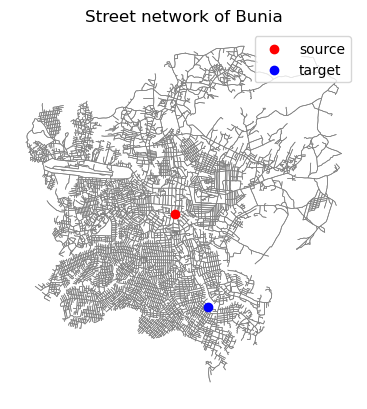

In [9]:
# let us plot the *first two nodes* and *all edges* of the Bunia network
fig, ax = plt.subplots(1,1)
edges_bun.plot(ax=ax, color = "grey", lw = 0.5, zorder = 0)
nodes_bun.filter([311740116], axis = 0).plot(ax=ax, color = "red", zorder = 1, label = "source")
nodes_bun.filter([311740124], axis = 0).plot(ax=ax, color = "blue", zorder = 1, label = "target")
ax.set_title("Street network of Bunia")
ax.set_axis_off()
ax.legend()
plt.show()

### Q5: What is the distance between the two source (red) and target (blue) nodes...
- ... on the network?
- ... as the (proverbial) crow flies?

Hint 1: `networkx` has a function to compute the shortest path length

Hint 2: geopandas has a `distance` method to compute distances between 2 geometries

In [10]:
# compute `distance_network` - the distance between the 2 nodes on the street network 
distance_network = networkx.shortest_path_length(
    G = G_bun, 
    source = 311740116, 
    target = 311740124, 
    weight = "length"
)
print("Distance on the network: ", distance_network)

Distance on the network:  3391.172


In [11]:
# compute `distance_crow` - the distance between the 2 nodes as the crow flies

mysource = nodes_bun.loc[311740116,"geometry"]
print("My source node: ", mysource)

mytarget = nodes_bun.loc[311740124,"geometry"]
print("My target node: ", mytarget)

distance_crow = mysource.distance(mytarget)
print("Distance as the crow flies: ", distance_crow)

My source node:  POINT (30.2476044 1.5528142)
My target node:  POINT (30.2574327 1.5253324)
Distance as the crow flies:  0.029186380593180485


### Q6: What is wrong here?

In [12]:
print(G_buc.graph["crs"])
print(G_bun.graph["crs"])
# The standard geographic CRS used by OSMnx

epsg:4326
epsg:4326


### To project the graph:
* `osmnx.project_graph(G, to_crs = None)` (OSMnx automatically determines UTM zone)
* `osmnx.project_graph(G, to_crs = <INSERT_CRS>)` (look up e.g. on [epsg.io](https://epsg.io))

In [13]:
# project the graph (with a manually or automatically defined crs)
G_bun_manu = osmnx.project_graph(G_bun, to_crs = "EPSG:32735")
G_bun_auto = osmnx.project_graph(G_bun, to_crs = None)

In [14]:
# get the "nodes" data frame once more
nodes_bun_manu = osmnx.graph_to_gdfs(G_bun_manu, nodes = True, edges = False)
nodes_bun_auto = osmnx.graph_to_gdfs(G_bun_auto, nodes = True, edges = False)

In [15]:
# compute `distance_crow` for the manually projected graph
mysource = nodes_bun_manu.loc[311740116,"geometry"]
mytarget = nodes_bun_manu.loc[311740124,"geometry"]
distance_crow_manu = mysource.distance(mytarget)
print("Distance as the crow flies, on manually projected graph: ", distance_crow_manu)

# compute `distance_crow` for the automatically projected graph
mysource = nodes_bun_auto.loc[311740116,"geometry"]
mytarget = nodes_bun_auto.loc[311740124,"geometry"]
distance_crow_auto = mysource.distance(mytarget)
print("Distance as the crow flies, on automatically projected graph: ", distance_crow_auto)

Distance as the crow flies, on manually projected graph:  3233.572736720196
Distance as the crow flies, on automatically projected graph:  3232.070321965602


### Q7: What is the "detour factor" for the path between our 2 nodes? 

(i.e. how much longer is network path in comparison to the straight line?)

`detour_factor = network_path / crow_path`

e.g. detour factor of 2 means that network_path is 2x as long as crow_path

In [16]:
detour_factor = distance_network / distance_crow_manu
print("The detour factor is: ", detour_factor)

The detour factor is:  1.0487384314848152


# Public transit networks

### GTFS (General Transit Feed Specification)
[https://gtfs.org](https://gtfs.org)

```
Data > 3rd party GTFS URL directories > The Mobility Database > Download the catalogs CSV
```


<p style="text-align:center;">
    <img src="images/gtfs-sourcelist.png" alt="List of GTFS sources" width=1000px>
</p>

### We will use Vitoria-Gasteiz (Euskadi) as an example 

Link to download GTFS feed:

http://www.vitoria-gasteiz.org/we001/http/vgTransit/google_transit.zip

In [17]:
# Read in 3 text files: routes; shapes; stop_times; stops; and trips
routes = pandas.read_csv(f'./data/GTFS_Data/routes.txt')
trips = pandas.read_csv(f'./data/GTFS_Data/trips.txt')
shapes = pandas.read_csv(f'./data/GTFS_Data/shapes.txt')

# the original crs is epsg:4326
crs_orig = "EPSG:4326"

# as projection we will use the crs epsg:2062
crs_proj = "EPSG:2062"

### Rethorical Q: Can we make a plot of all public transit lines in Vitoria-Gasteiz?

A: Yes we can! It's just a bit messy

Information is spread out over 3 files:

* `routes` contains route IDs and names (routes = public transit lines)
* `trips` contains all trips for each route, and their "shape id"
* `shapes` contains the geometries corresponding to each shape id 

In [18]:
# routes: each row is a *route* (e.g. a certain busline)
routes = routes[["route_id", "route_long_name"]]
routes.head(10)

,route_id,route_long_name
0,N4,Especial mendi B nocturno
1,N2,Eventos Buesa noche
2,G6,Salburua - Aranbizkarra
3,N1,Baskonia Noche
4,G3,Armentia - Zabalgana
5,G2,Adurtza - Errekaleor
6,FN,Ferial Nocturno
7,F,Ferial
8,ES,San Prudencio
9,E7,Abetxuko


In [19]:
# trips: each row is a trip (e.g. the 10'o clock bus nr. 6 in a given direction); 
# so each route has several trips (with different schedules)
trips = trips[["route_id", "trip_id", "shape_id", "trip_headsign"]]
trips.head(10)

,route_id,trip_id,shape_id,trip_headsign
0,6,pse-0003fc81899,shp_3_56,hacia Iliada / Gabriel Martínez Aragón
1,A,pse-0005f275870,shp_3_76,hacia Mendizorrotza
2,A,pse-00073b1b8a2,shp_3_76,hacia Mendizorrotza
3,A,pse-000af9b20ec,shp_3_76,hacia Mendizorrotza
4,7,pse-000f4a24c3f,shp_3_43,hacia Henry Morton Stanley / Océano Atlántico
5,B,pse-001671e8508,shp_3_78,hacia Mendizorrotza
6,B,pse-00171668b5c,shp_3_66,hacia Zaramaga/ Boulevard
7,3,pse-0017649de66,shp_3_25,hacia Portal Bergara 25
8,A,pse-0017ad5e43f,shp_3_60,hacia Zaramaga/ Boulevard
9,7,pse-001c666b0ab,shp_3_35,hacia Iliada / Bulevar Salburua


In [20]:
# shapes: each row is a point of a linestring
shapes.head(10)

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence
0,shp_3_1,42.853481,-2.708661,1
1,shp_3_1,42.853565,-2.708604,2
2,shp_3_1,42.853775,-2.708442,3
3,shp_3_1,42.853943,-2.708288,4
4,shp_3_1,42.854118,-2.708112,5
5,shp_3_1,42.854282,-2.707914,6
6,shp_3_1,42.854404,-2.707749,7
7,shp_3_1,42.854542,-2.707530,8
8,shp_3_1,42.854664,-2.707314,9
9,shp_3_1,42.854797,-2.707038,10


### Q8: How can we convert the "shapes" dataframe into a geodataframe?

Hint 1: you can use the `geopandas.GeoSeries.from_xy()` method, where the input consists of two list of point coordinates (longitude, latitude)

Hint 2: you need to define a CRS when creating a geodataframe (for this data set, it is `EPSG:4326`)


In [21]:
### Converting the "shapes" file into a geodataframe with a geometry column

# Get the geometry column (aggregating the longitude and latitude information)
shapes["geometry"] = geopandas.GeoSeries.from_xy(
    x = shapes["shape_pt_lon"], y = shapes["shape_pt_lat"])
# Remove not needed columns
shapes.drop(columns = ["shape_pt_lat", "shape_pt_lon"], inplace = True)
# Make a GeoDataFrame (pass a geometry column and a crs!)
shapes = geopandas.GeoDataFrame(shapes, geometry = "geometry", crs = crs_orig)
# Project into a projected CRS (here: for nicer plotting)
shapes = shapes.to_crs(crs_proj)
# check the result:
shapes.head()

,shape_id,shape_pt_sequence,geometry
0,shp_3_1,1,POINT (680001.478 917106.523)
1,shp_3_1,2,POINT (680006.034 917115.906)
2,shp_3_1,3,POINT (680019.020 917139.380)
3,shp_3_1,4,POINT (680031.402 917158.182)
4,shp_3_1,5,POINT (680045.575 917177.781)


<Axes: >

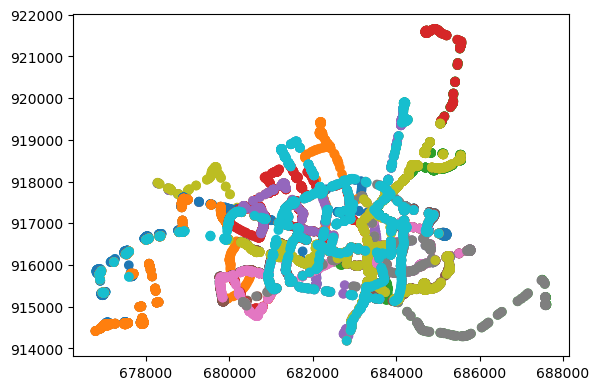

In [36]:
# We're not done yet! We still need to aggregate points into trajectories:
# Each point is part of a linestring describing the trajectory of a trip, NOT a stop
shapes.plot(column = "shape_id")

In [23]:
# For each unique shape_id, combine all points (in correct sequence order) into one linestring:

# initialize list for shape ids and list for shape geometries (linestrings)
shape_ids = []
shape_geoms = []

# loop through unique shape ids
for shape_id_current, shape_df_current in shapes.groupby("shape_id"):
    
    # sort the subset of the dataframe for this unique shape id by shape_pt_sequence
    shape_df_current = shape_df_current.sort_values(by = "shape_pt_sequence", ascending=True)
    
    # get a list of shape points (the geometry column, orderer by shape_pt_sequence)
    list_of_shape_points = list(shape_df_current.geometry)

### !!! HERE THE MAGIC HAPPENS:
    
    # make a linestring from the list of points
    shape_geom_current = shapely.geometry.LineString(list_of_shape_points)

### MAGIC IS OVER
    
    # append the current shape id and the current line string to our list of results
    shape_ids.append(shape_id_current)
    shape_geoms.append(shape_geom_current)

In [24]:
# make a geodataframe from the lists of results
shapes_gdf = geopandas.GeoDataFrame(
    {
        "geometry": shape_geoms,
        "shape_id": shape_ids
    },
    crs = shapes.crs
    )

shapes_gdf.head()

,geometry,shape_id
0,"LINESTRING (680001.478 917106.523, 680006.034 ...",shp_3_1
1,"LINESTRING (685022.260 916753.965, 685061.349 ...",shp_3_10
2,"LINESTRING (685022.260 916753.965, 685061.349 ...",shp_3_11
3,"LINESTRING (682593.118 916156.843, 682568.713 ...",shp_3_12
4,"LINESTRING (682611.555 916174.828, 682568.713 ...",shp_3_13


In [37]:
# But we're still not done - each route has several shape_ids... 
# make a list of shape_ids for each route:
route_shapes = trips.groupby("route_id").aggregate({"shape_id": list})
route_shapes["route_id"] = route_shapes.index
route_shapes.reset_index(drop=True, inplace=True)
route_shapes.head()


,shape_id,route_id
0,"[shp_3_12, shp_3_12, shp_3_12, shp_3_68, shp_3...",1
1,"[shp_3_70, shp_3_62, shp_3_47, shp_3_70, shp_3...",10
2,"[shp_3_25, shp_3_26, shp_3_25, shp_3_25, shp_3...",3
3,"[shp_3_59, shp_3_38, shp_3_38, shp_3_38, shp_3...",4
4,"[shp_3_7, shp_3_4, shp_3_4, shp_3_1, shp_3_7, ...",5


In [26]:
# for each route, merge the geometries of all shape_ids together with the .unary_union method
route_shapes["geometry"] = route_shapes.apply(
    lambda x: 
        shapes_gdf[shapes_gdf.shape_id.isin(x.shape_id)]["geometry"].unary_union,
    axis = 1
    )
route_shapes.head()

,shape_id,route_id,geometry
0,"[shp_3_12, shp_3_12, shp_3_12, shp_3_68, shp_3...",1,MULTILINESTRING ((682593.118230503 916156.8428...
1,"[shp_3_70, shp_3_62, shp_3_47, shp_3_70, shp_3...",10,MULTILINESTRING ((682611.5554463234 916174.828...
2,"[shp_3_25, shp_3_26, shp_3_25, shp_3_25, shp_3...",3,MULTILINESTRING ((683231.5979810819 915195.738...
3,"[shp_3_59, shp_3_38, shp_3_38, shp_3_38, shp_3...",4,MULTILINESTRING ((681466.6418314461 918364.572...
4,"[shp_3_7, shp_3_4, shp_3_4, shp_3_1, shp_3_7, ...",5,MULTILINESTRING ((680001.4778270179 917106.523...


In [27]:
# merge the route_shapes information to our routes table
gdf = pandas.merge(routes, route_shapes, how = "left")
# convert into a geodataframe
gdf = geopandas.GeoDataFrame(gdf, geometry = "geometry", crs = shapes_gdf.crs)
# drop empty rows
gdf = gdf.dropna().reset_index(drop=True)
gdf.head()


,route_id,route_long_name,shape_id,geometry
0,G6,Salburua - Aranbizkarra,"[shp_3_54, shp_3_54, shp_3_54, shp_3_54, shp_3...","MULTILINESTRING ((683326.722 916101.644, 68329..."
1,G3,Armentia - Zabalgana,"[shp_3_19, shp_3_19, shp_3_19, shp_3_19, shp_3...","MULTILINESTRING ((682611.555 916174.828, 68256..."
2,G2,Adurtza - Errekaleor,"[shp_3_49, shp_3_49, shp_3_49, shp_3_49, shp_3...","MULTILINESTRING ((683326.722 916101.644, 68329..."
3,FN,Ferial Nocturno,"[shp_3_58, shp_3_14, shp_3_14, shp_3_14, shp_3...","MULTILINESTRING ((682611.555 916174.828, 68256..."
4,ES,San Prudencio,"[shp_3_5, shp_3_5, shp_3_63, shp_3_63, shp_3_6...","MULTILINESTRING ((680413.103 915022.440, 68038..."


In [28]:
# Visualize on an interactive map, where each route_id has a separate color:
gdf[["route_id", "route_long_name", "geometry"]].explore(column="route_id")

### Q9: What about the *stops*? Can we make a plot of all the public transit stops?

* task 1: read in the stops file
* task 2: convert it into a geodataframe (needs a geometry column and a CRS; same as we did with the "shapes" file)
* task 3: visualize it on a map in a projected CRS; only the stop_name should appear when hovering

<p style="text-align:center;">
    <img src="images/gasteiz-stops.png" alt="Public transit stops in Gasteiz" width=500px>
</p>

In [29]:
# Task 1: Read in file
stops = pandas.read_csv("./data/GTFS_Data/stops.txt")
stops.head()

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,stop_timezone,wheelchair_boarding,platform_code,level_id
0,1001,1001,Intermodal,NaN,42.859520,-2.680170,1,NaN,0,NaN,Europe/Madrid,0,NaN,NaN
1,1002,1002,Juan de Garay / Paraguay,NaN,42.860359,-2.677363,1,NaN,0,NaN,Europe/Madrid,0,NaN,NaN
2,1003,1003,Zaramaga / Reyes Navarra,NaN,42.861229,-2.670000,1,NaN,0,NaN,Europe/Madrid,0,NaN,NaN
3,1006,1006,Portal Legutiano /Iparralde,NaN,42.854958,-2.666627,1,NaN,0,NaN,Europe/Madrid,0,NaN,NaN
4,1007,1007,Valladolid 10,NaN,42.853359,-2.664160,1,NaN,0,NaN,Europe/Madrid,0,NaN,NaN


In [30]:
# Task 2: Convert it into a geodataframe
stops["geometry"] = geopandas.GeoSeries.from_xy(x = stops["stop_lon"], y = stops["stop_lat"])
stops = geopandas.GeoDataFrame(stops, geometry = "geometry", crs = crs_orig)

In [31]:
# Task 3: Project and visualize with the "stop_name" as appearing attribute
stops = stops.to_crs(crs_proj)
stops[["geometry", "stop_name"]].explore(color = "red", marker_kwds = {"radius": 5})